Reference: [DCGAN TUTORIAL](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html)

Author: Nathan Inkawhich

In [1]:
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim

import random
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Set random seem for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [3]:
torch.cuda.is_available()

True

In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [5]:
# number of GPUs
ngpu = 1
lr = 0.0002
beta1 = 0.5
num_epochs = 5

In [6]:
device

device(type='cuda', index=0)

# Data Preprocess and Load

In [7]:
data_dir = '../data/celeba-dataset'

In [8]:
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils

In [9]:
image_size = 64
batch_size = 128

In [10]:
dataset = dset.ImageFolder(root = data_dir,
                           transform = transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

In [11]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size = batch_size,
                                         shuffle = True, num_workers = 4)

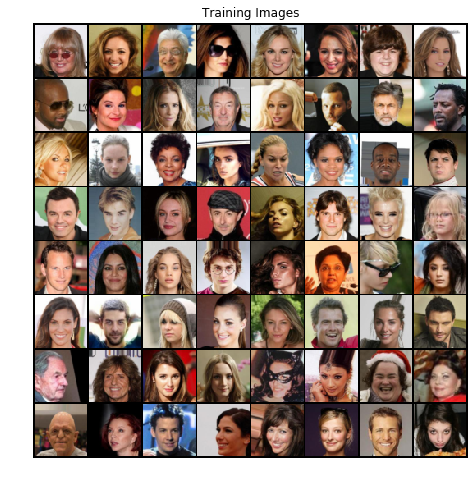

In [12]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Model

In [13]:
nz = 100 # size of latent vector/ noise dim
nc = 3 # number of image channels
ngf = 64 # imgae_size
ndf = 64

## weight init

In [14]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## Generator model

<img src="G.png">

In [15]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super().__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(in_channels = nz, 
                               out_channels = ngf*8, 
                               kernel_size = 4, 
                               stride = 1,
                               padding = 0,
                               bias = False  ),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(inplace = True),
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias = False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(inplace = True),
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias = False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(inplace = True),
            nn.ConvTranspose2d(ngf*2, ngf*1, 4, 2, 1, bias = False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(inplace = True),
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )
        
    def forward(self, input):
        return self.main(input)

In [16]:
# Instantiate the generator and send to CUDA
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
    
# apply the weight init function
netG.apply(weights_init)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

## Discriminator Model
### input : 3\*64\*64 input image

In [17]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super().__init__()
        self.main = nn.Sequential(
            nn.Conv2d(in_channels = nc, 
                      out_channels = ndf,
                      kernel_size = 4,
                      stride = 2,
                      padding = 1,
                      bias = False
                     ),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias = False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias = False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias = False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias = False),
            nn.Sigmoid()
        )
        
    def forward(self, input):
        return self.main(input)

In [18]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

# Loss and optimizer

In [19]:
criterion = nn.BCELoss()

# Create batch of fixed latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device = device)



# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0
# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# **Train**

In [20]:
img_list = []
G_losses = []
D_losses = []
iters = 0

In [21]:
for epoch in range(num_epochs): 
    for i, data in enumerate(dataloader, 0):
        
        ########## Discriminator ###########
        
        ## Training Real data
        netD.zero_grad()
        real_cpu = data[0].to(device) # image input, shape = [batch_size(128), 3, 64, 64]
        b_size = real_cpu.size(0) # get batch size
        label = torch.full(size = (b_size,), fill_value = real_label, device = device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)

        errD_real.backward()
        
        D_x = output.mean().item()
        
        ## Training Fake data
        noise = torch.randn(b_size, nz, 1, 1, device = device)
        label.fill_(fake_label)
        fake = netG(noise)# generate fake images
        
        output = netD(fake.detach()).view(-1)# detach: requires no grad, not training params
        errD_fake = criterion(output, label)
        
        errD_fake.backward()
        
        D_G_z1 = output.mean().item()# get scalar
        
        errD = errD_real + errD_fake
        optimizerD.step()
        
        ############ Generator ############
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Output training stats
        if i % 500 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # record fixed noise change
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

[0/5][0/1583]	Loss_D: 1.7410	Loss_G: 4.7762	D(x): 0.5343	D(G(z)): 0.5771 / 0.0136
[0/5][500/1583]	Loss_D: 0.7818	Loss_G: 14.2521	D(x): 0.8098	D(G(z)): 0.0026 / 0.0016
[0/5][1000/1583]	Loss_D: 0.7521	Loss_G: 4.3288	D(x): 0.8960	D(G(z)): 0.3987 / 0.0274
[0/5][1500/1583]	Loss_D: 0.4656	Loss_G: 3.0359	D(x): 0.8185	D(G(z)): 0.1737 / 0.0738
[1/5][0/1583]	Loss_D: 0.6625	Loss_G: 4.8828	D(x): 0.8970	D(G(z)): 0.3725 / 0.0134
[1/5][500/1583]	Loss_D: 0.5114	Loss_G: 3.3174	D(x): 0.8121	D(G(z)): 0.2136 / 0.0573
[1/5][1000/1583]	Loss_D: 0.8825	Loss_G: 1.7924	D(x): 0.5109	D(G(z)): 0.0565 / 0.2222
[1/5][1500/1583]	Loss_D: 0.7215	Loss_G: 4.3797	D(x): 0.9466	D(G(z)): 0.4445 / 0.0184
[2/5][0/1583]	Loss_D: 0.8864	Loss_G: 4.8452	D(x): 0.8822	D(G(z)): 0.4687 / 0.0117
[2/5][500/1583]	Loss_D: 0.5195	Loss_G: 2.0854	D(x): 0.7445	D(G(z)): 0.1598 / 0.1650
[2/5][1000/1583]	Loss_D: 0.6056	Loss_G: 2.5074	D(x): 0.6633	D(G(z)): 0.1224 / 0.1143
[2/5][1500/1583]	Loss_D: 0.5869	Loss_G: 2.3132	D(x): 0.7760	D(G(z)): 0.2511 

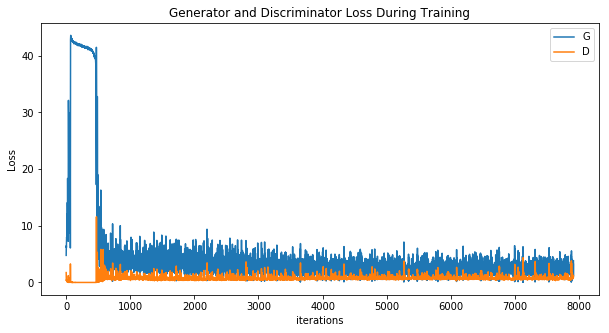

In [22]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [24]:
from IPython.display import HTML
import matplotlib.animation as animation

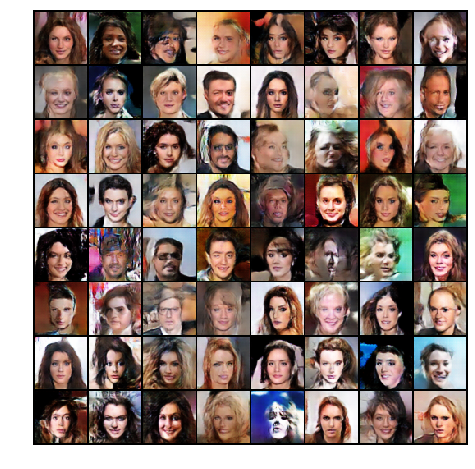

In [25]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

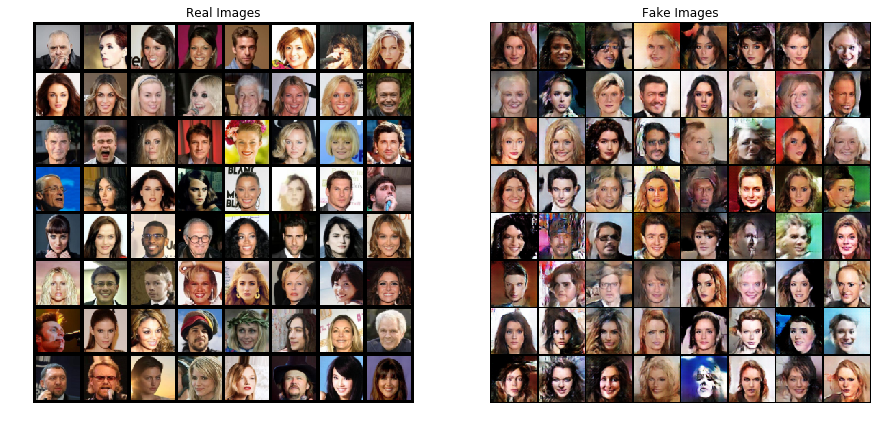

In [26]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()